#**1) Importing the necessary libraries**

In [244]:
import numpy as np
import pandas as pd
import seaborn as sns 
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import plotly.express as px
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from scipy.spatial.distance import cdist

#**2) Understanding the Data**

In [245]:
data_raw = pd.read_csv("data.csv")

In [246]:
print(data_raw.head())

   valence  year  acousticness  \
0   0.0594  1921         0.982   
1   0.9630  1921         0.732   
2   0.0394  1921         0.961   
3   0.1650  1921         0.967   
4   0.2530  1921         0.957   

                                             artists  danceability  \
0  ['Sergei Rachmaninoff', 'James Levine', 'Berli...         0.279   
1                                     ['Dennis Day']         0.819   
2  ['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...         0.328   
3                                   ['Frank Parker']         0.275   
4                                     ['Phil Regan']         0.418   

   duration_ms  energy  explicit                      id  instrumentalness  \
0       831667   0.211         0  4BJqT0PrAfrxzMOxytFOIz          0.878000   
1       180533   0.341         0  7xPhfUan2yNtyFG0cUWkt8          0.000000   
2       500062   0.166         0  1o6I8BglA6ylDMrIELygv1          0.913000   
3       210000   0.309         0  3ftBPsC5vPBKxYSee08FDH      

In [247]:
print(data_raw.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

#**3) Data Cleaning**

In [248]:
df = data_raw.drop(data_raw.columns[[1,3,8,16]], axis=1)

In [249]:
df.head()

,valence,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo
0,0.0594,0.982,0.279,831667,0.211,0,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,0.0366,80.954
1,0.9630,0.732,0.819,180533,0.341,0,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,0.4150,60.936
2,0.0394,0.961,0.328,500062,0.166,0,0.913000,3,0.101,-14.850,1,Gati Bali,5,0.0339,110.339
3,0.1650,0.967,0.275,210000,0.309,0,0.000028,5,0.381,-9.316,1,Danny Boy,3,0.0354,100.109
4,0.2530,0.957,0.418,166693,0.193,0,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,0.0380,101.665


In [250]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 15 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   acousticness      170653 non-null  float64
 2   danceability      170653 non-null  float64
 3   duration_ms       170653 non-null  int64  
 4   energy            170653 non-null  float64
 5   explicit          170653 non-null  int64  
 6   instrumentalness  170653 non-null  float64
 7   key               170653 non-null  int64  
 8   liveness          170653 non-null  float64
 9   loudness          170653 non-null  float64
 10  mode              170653 non-null  int64  
 11  name              170653 non-null  object 
 12  popularity        170653 non-null  int64  
 13  speechiness       170653 non-null  float64
 14  tempo             170653 non-null  float64
dtypes: float64(9), int64(5), object(1)
memory usage: 19.5+ MB


In [251]:
df.isnull().sum()/len(df)
#There are no null values

valence             0.0
acousticness        0.0
danceability        0.0
duration_ms         0.0
energy              0.0
explicit            0.0
instrumentalness    0.0
key                 0.0
liveness            0.0
loudness            0.0
mode                0.0
name                0.0
popularity          0.0
speechiness         0.0
tempo               0.0
dtype: float64

In [252]:
print(df.loc[df.duplicated()])

        valence  acousticness  danceability  duration_ms  energy  explicit  \
2298     0.7700      0.930000         0.721       155667   0.186         0   
2340     0.9450      0.958000         0.761       173667   0.420         0   
3067     0.8140      0.890000         0.579       159800   0.293         0   
8459     0.9120      0.623000         0.733       154907   0.624         0   
16290    0.5830      0.364000         0.555       250889   0.568         0   
...         ...           ...           ...          ...     ...       ...   
163520   0.5370      0.330000         0.654       316773   0.693         0   
164735   0.2630      0.000004         0.262       184040   0.969         0   
164820   0.1080      0.000144         0.285       142947   0.979         0   
165077   0.8990      0.054400         0.806       162160   0.489         0   
167671   0.0347      0.994000         0.174       278933   0.178         0   

        instrumentalness  key  liveness  loudness  mode  \
2298

In [253]:
# Removing duplicate rows
df.drop_duplicates(inplace=True)
df = df.reset_index(drop=True)
print(df.head())

   valence  acousticness  danceability  duration_ms  energy  explicit  \
0   0.0594         0.982         0.279       831667   0.211         0   
1   0.9630         0.732         0.819       180533   0.341         0   
2   0.0394         0.961         0.328       500062   0.166         0   
3   0.1650         0.967         0.275       210000   0.309         0   
4   0.2530         0.957         0.418       166693   0.193         0   

   instrumentalness  key  liveness  loudness  mode  \
0          0.878000   10     0.665   -20.096     1   
1          0.000000    7     0.160   -12.441     1   
2          0.913000    3     0.101   -14.850     1   
3          0.000028    5     0.381    -9.316     1   
4          0.000002    3     0.229   -10.096     1   

                                                name  popularity  speechiness  \
0  Piano Concerto No. 3 in D Minor, Op. 30: III. ...           4       0.0366   
1                            Clancy Lowered the Boom           5       0.4

<Axes: >

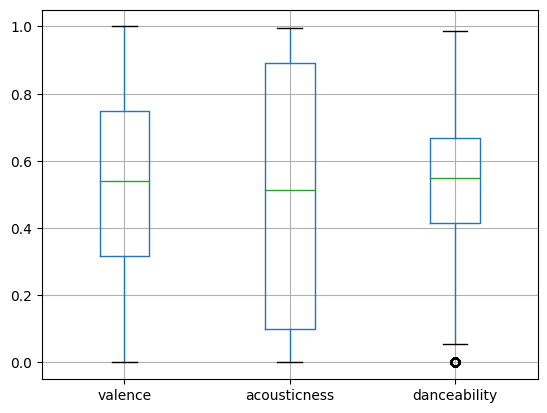

In [220]:
df.iloc[:, 0:3].boxplot()

<Axes: >

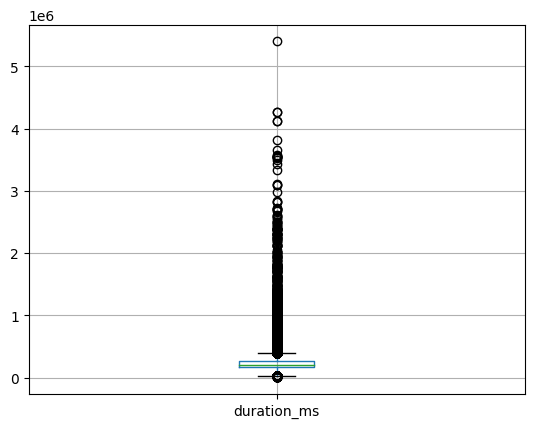

In [221]:
df.iloc[:, 3:4].boxplot()

<Axes: >

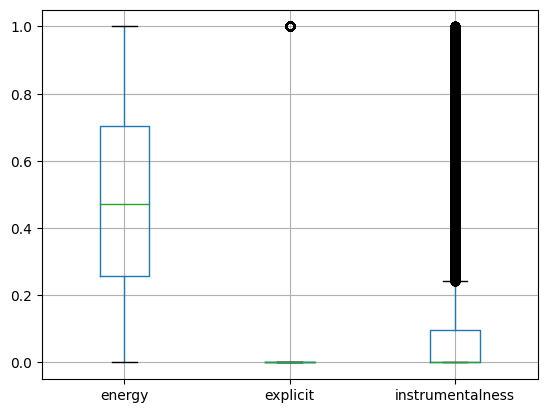

In [222]:
df.iloc[:, 4:7].boxplot()

<Axes: >

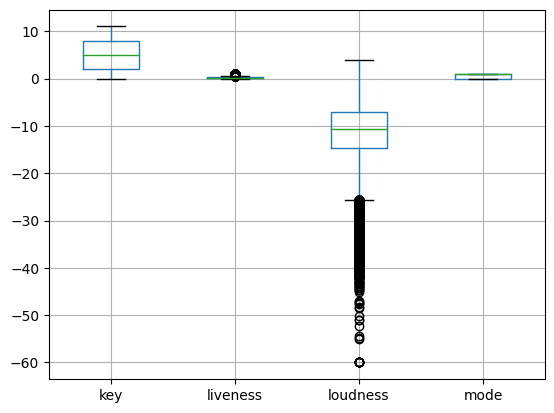

In [223]:
df.iloc[:, 7:12].boxplot()

<Axes: >

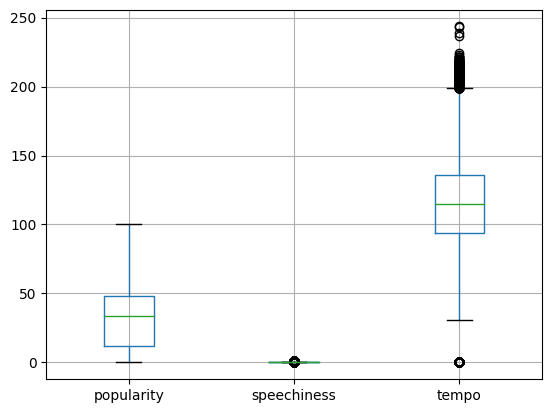

In [226]:
df.iloc[:, 12:15].boxplot()

#**4) Exploratory Data Analysis**

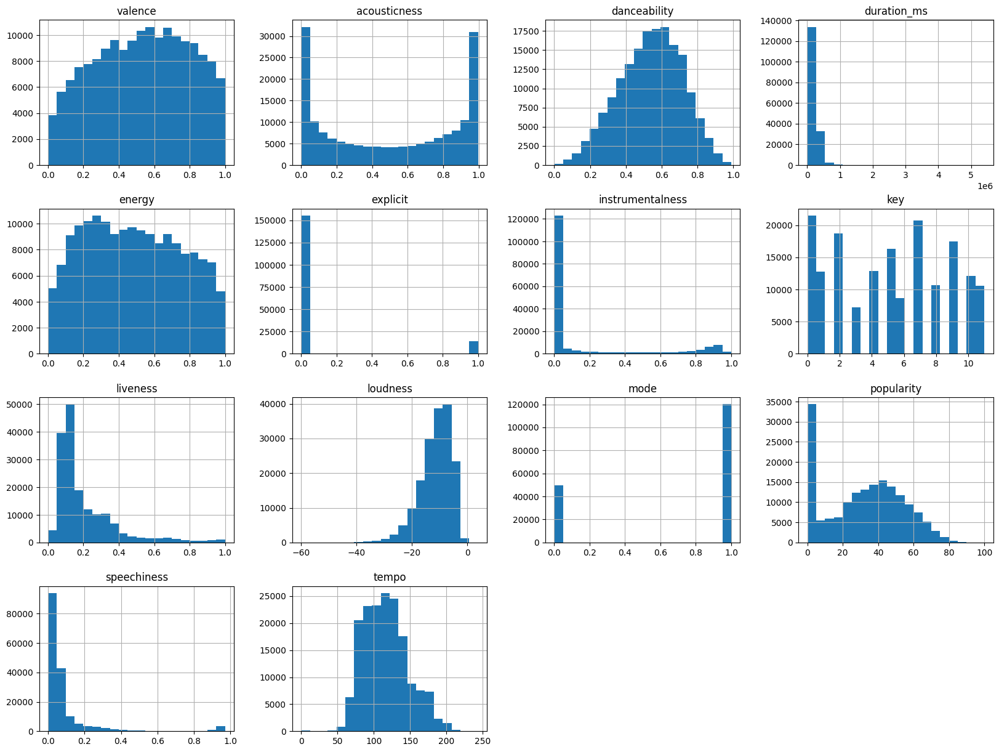

In [227]:
df.hist(bins=20, figsize=(20,15))
plt.show()

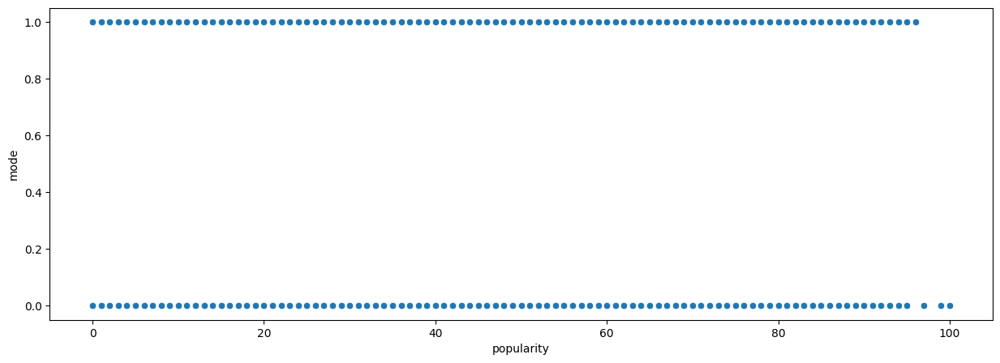

In [228]:
plt.figure(figsize=(15,5))
sns.scatterplot(x="popularity", y="mode", data=df)
plt.show()
# Woah, mode is equally distributed

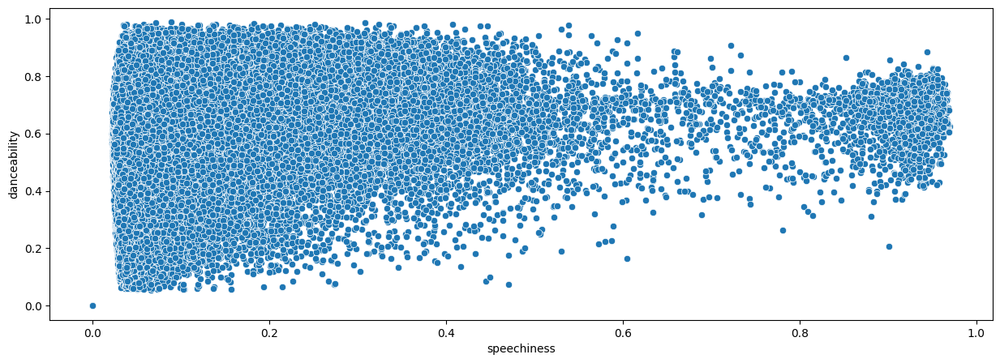

In [229]:
plt.figure(figsize=(15,5))
sns.scatterplot(x="speechiness", y="danceability", data=df)
plt.show()
# Sing less, dance more

<Axes: ylabel='loudness'>

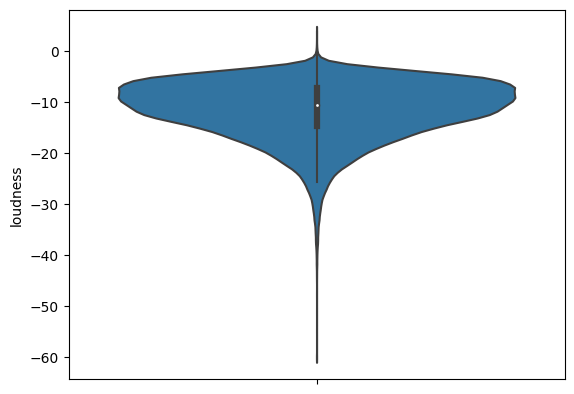

In [230]:
sns.violinplot(y = df.loudness)

<ipython-input-231-15370c5f9fc0>:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



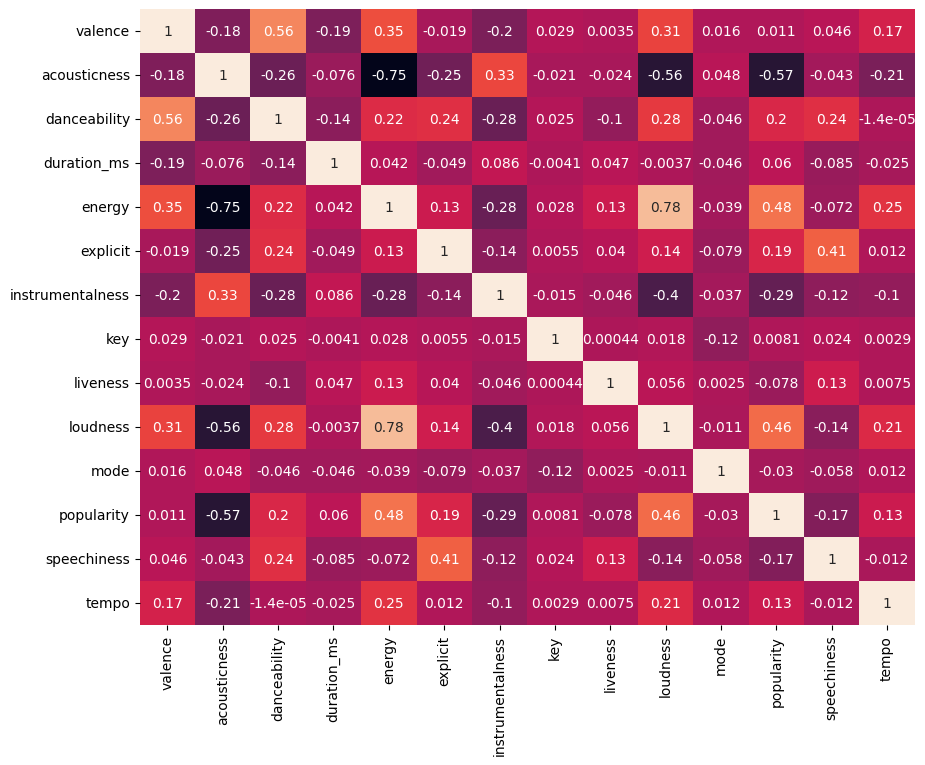

In [231]:
plt.figure(figsize=(10,8))
sns.heatmap(df.corr(),annot=True,cbar=False)
plt.show()
# Energy and acousticness are very negatively correlated, since many features are correlated with each other, we'll use PCA

#**4) Data Preparation**

#**4.1) Standard scaling**

In [254]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_std = pd.DataFrame(scaler.fit_transform(df.select_dtypes(np.number)))
df_std.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,-1.786434,1.282366,-1.470805,4.767582,-1.018347,-0.304639,2.283275,1.365643,2.624533,-1.523798,0.643667,-1.265964,-0.380149,-1.171062
1,1.649865,0.616762,1.596809,-0.400567,-0.532267,-0.304639,-0.529996,0.512170,-0.262501,-0.175700,0.643667,-1.220038,1.940496,-1.823109
2,-1.862492,1.226456,-1.192448,2.135583,-1.186606,-0.304639,2.395421,-0.625794,-0.599798,-0.599941,0.643667,-1.220038,-0.396708,-0.213902
3,-1.384848,1.242430,-1.493528,-0.166683,-0.651917,-0.304639,-0.529907,-0.056812,1.000934,0.374633,0.643667,-1.311891,-0.387509,-0.547125
4,-1.050193,1.215806,-0.681179,-0.510417,-1.085651,-0.304639,-0.529990,-0.625794,0.131965,0.237270,0.643667,-1.357817,-0.371563,-0.496441


In [255]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 169847 entries, 0 to 169846
Data columns (total 15 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           169847 non-null  float64
 1   acousticness      169847 non-null  float64
 2   danceability      169847 non-null  float64
 3   duration_ms       169847 non-null  int64  
 4   energy            169847 non-null  float64
 5   explicit          169847 non-null  int64  
 6   instrumentalness  169847 non-null  float64
 7   key               169847 non-null  int64  
 8   liveness          169847 non-null  float64
 9   loudness          169847 non-null  float64
 10  mode              169847 non-null  int64  
 11  name              169847 non-null  object 
 12  popularity        169847 non-null  int64  
 13  speechiness       169847 non-null  float64
 14  tempo             169847 non-null  float64
dtypes: float64(9), int64(5), object(1)
memory usage: 19.4+ MB


#**4.2) PCA**

In [256]:
from sklearn.decomposition import PCA
import numpy as np

# assuming X is your standardized dataset
# create a PCA instance with desired number of components
pca = PCA(n_components=9)

# fit the PCA instance on X


# transform X to the new coordinate system
data_pca = pd.DataFrame(pca.fit_transform(df_std))

# print the explained variance ratios for each component
print(pca.explained_variance_ratio_)

[0.24827604 0.12031908 0.09785871 0.08041057 0.07798829 0.06693632
 0.06512211 0.05990392 0.05358838]


In [257]:
data_pca.head()

,0,1,2,3,4,5,6,7,8
0,3.933814,2.136420,3.030339,0.780624,2.210729,2.369602,0.399567,2.946328,-0.601865
1,0.335127,-3.004669,-1.150453,-0.157795,0.004288,1.766469,-0.484535,0.851947,0.093403
2,3.448474,1.667464,0.989997,0.141154,-0.523394,0.088042,1.227853,1.397276,-0.770671
3,1.876500,0.671853,0.371296,1.346314,0.334716,0.303551,-1.235009,-0.601500,0.593276
4,1.853034,0.062713,-0.364621,0.957422,-0.503504,0.165130,-0.715372,-0.590724,0.712427


#**5) K Means Clustering**

#**5.1) Elbow Method**

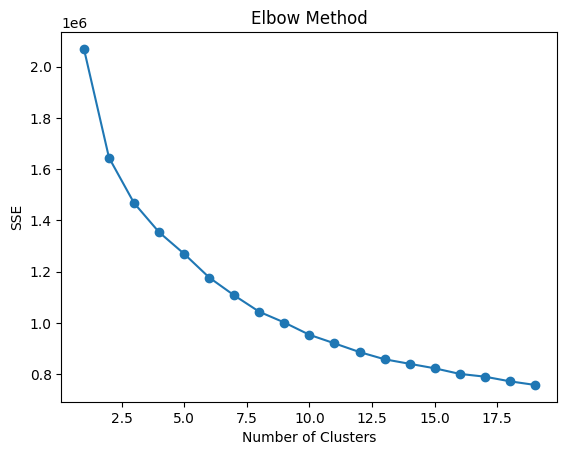

In [236]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt


# initialize lists to store the results
wcss = []

# iterate over the cluster range
for i in range(1,20):
    # create a KMeans instance with n_clusters
    Kmeans = KMeans(n_clusters=i, n_init=10, random_state=42)
    # fit the KMeans instance on X
    Kmeans.fit(data_pca)
    wcss.append(Kmeans.inertia_)

# plot the elbow curve
plt.plot(range(1,20), wcss, 'o-')
plt.xlabel('Number of Clusters')
plt.ylabel('SSE')
plt.title('Elbow Method')
plt.show()

In [237]:
for i in range(1,20):
  print("WCSS score for number of clusters = {0} is {1}".format(i,wcss[i-1]))
# So, we found out that the elbow/ optimal number of clusters is 6

WCSS score for number of clusters = 1 is 2069695.700491738
WCSS score for number of clusters = 2 is 1645007.9251718274
WCSS score for number of clusters = 3 is 1467838.7907974543
WCSS score for number of clusters = 4 is 1353844.851549556
WCSS score for number of clusters = 5 is 1269510.6763877322
WCSS score for number of clusters = 6 is 1177018.7827966823
WCSS score for number of clusters = 7 is 1107091.9347535186
WCSS score for number of clusters = 8 is 1043242.7166807491
WCSS score for number of clusters = 9 is 1001252.7988307835
WCSS score for number of clusters = 10 is 953353.3434240269
WCSS score for number of clusters = 11 is 919975.5744135041
WCSS score for number of clusters = 12 is 885994.2643117715
WCSS score for number of clusters = 13 is 857780.6317424998
WCSS score for number of clusters = 14 is 840036.018388898
WCSS score for number of clusters = 15 is 822564.3366284203
WCSS score for number of clusters = 16 is 800652.062135836
WCSS score for number of clusters = 17 is 78

#**5.2) Fitting the data**

In [258]:
k_means = KMeans(n_clusters=6, verbose=False)
k_means.fit(data_pca)
labels = k_means.predict(data_pca)
df['cluster_label'] = labels

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [259]:
df.head()

,valence,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,cluster_label
0,0.0594,0.982,0.279,831667,0.211,0,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,0.0366,80.954,3
1,0.9630,0.732,0.819,180533,0.341,0,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,0.4150,60.936,2
2,0.0394,0.961,0.328,500062,0.166,0,0.913000,3,0.101,-14.850,1,Gati Bali,5,0.0339,110.339,3
3,0.1650,0.967,0.275,210000,0.309,0,0.000028,5,0.381,-9.316,1,Danny Boy,3,0.0354,100.109,0
4,0.2530,0.957,0.418,166693,0.193,0,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,0.0380,101.665,0


#**5.3) Visualizing the clusters**

In [260]:
pca = PCA(n_components=2)
song_embedding = pca.fit_transform(df_std)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = df['name']
projection['cluster'] = df['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

In [264]:
print("Silhouette score for number of clusters = 6 is", silhouette_score(data_pca, k_means.labels_))

Silhouette score for number of clusters = 6 is 0.15437082072716413


#**6) Song recommendation system**

In [261]:
def recommend_song(ind, df, no_of_songs):
    df_input_train = df.loc[[ind]].reset_index(drop=True)
    df_important = df[df['cluster_label'] == df.loc[ind, 'cluster_label']].reset_index(drop=True)
    scaler = StandardScaler()
    df_input_new = df_input_train.loc[:, df_input_train.columns != 'cluster_label']
    df_important_new = df_important.loc[:, df_important.columns != 'cluster_label']
    df_input_std = pd.DataFrame(scaler.fit_transform(df_input_new.select_dtypes(np.number)))
    df_important_std = pd.DataFrame(scaler.fit_transform(df_important_new.select_dtypes(np.number)))
    distances = cdist(df_input_std, df_important_std, 'cosine')
    index = list(np.argsort(distances)[:, :no_of_songs][0])
    recommended_songs = df_important.iloc[index]
    return recommended_songs

#**6.1) Recommendening the data of best 5 songs you would like to hear**

In [262]:
df_test = recommend_song(5, df, 5)
print(df_test)

       valence  acousticness  danceability  duration_ms  energy  explicit  \
0        0.165         0.967         0.275       210000  0.3090         0   
21709    0.318         0.953         0.471       137093  0.0657         0   
21708    0.425         0.683         0.416       154667  0.2300         0   
21707    0.186         0.861         0.255       158893  0.2340         0   
21706    0.434         0.966         0.560       281253  0.0514         0   

       instrumentalness  key  liveness  loudness  mode                 name  \
0              0.000028    5     0.381    -9.316     1            Danny Boy   
21709          0.096400    0     0.124   -19.594     0   The Side of a Hill   
21708          0.000000    4     0.220   -15.853     1  The Great Pretender   
21707          0.020000    2     0.113   -13.506     1           Mr. Lonely   
21706          0.008730    3     0.116   -25.435     1       Hi-Lili, Hi-Lo   

       popularity  speechiness    tempo  cluster_label  
0    

#**6.2) Names of those 5 songs**

In [263]:
print(df_test['name'])

0                  Danny Boy
21709     The Side of a Hill
21708    The Great Pretender
21707             Mr. Lonely
21706         Hi-Lili, Hi-Lo
Name: name, dtype: object


In [265]:
print(df.iloc[5])

valence                    0.196
acousticness               0.579
danceability               0.697
duration_ms               395076
energy                     0.346
explicit                       0
instrumentalness           0.168
key                            2
liveness                    0.13
loudness                 -12.506
mode                           1
name                Gati Mardika
popularity                     6
speechiness                 0.07
tempo                    119.824
cluster_label                  0
Name: 5, dtype: object
